In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import joblib
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

In [2]:
df = pd.read_excel('patient_dataset.xlsx')
df.head()

,age,gender,chest_pain_type,blood_pressure,cholesterol,max_heart_rate,exercise_angina,plasma_glucose,skin_thickness,insulin,bmi,diabetes_pedigree,hypertension,heart_disease,residence_type,smoking_status
0,24,1.0,4,250,139,212,0,108.0,33.0,109.0,37.999303,0.480277,1,1,Urban,Smoker
1,29,0.0,4,132,187,147,0,202.0,42.0,NaN,25.588346,0.283986,1,1,Urban,Unknown
2,46,0.0,3,271,185,193,0,149.0,43.0,102.0,37.892029,2.472309,1,0,Rural,Non-Smoker
3,73,NaN,2,102,200,125,0,105.0,77.0,165.0,18.660241,1.472052,0,1,Rural,Smoker
4,49,1.0,3,91,163,192,0,162.0,31.0,170.0,12.767980,0.537627,1,1,Rural,Smoker


In [3]:
df.info()

df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                6000 non-null   int64  
 1   gender             5528 non-null   float64
 2   chest_pain_type    6000 non-null   int64  
 3   blood_pressure     6000 non-null   int64  
 4   cholesterol        6000 non-null   int64  
 5   max_heart_rate     6000 non-null   int64  
 6   exercise_angina    6000 non-null   int64  
 7   plasma_glucose     5391 non-null   float64
 8   skin_thickness     5386 non-null   float64
 9   insulin            5432 non-null   float64
 10  bmi                6000 non-null   float64
 11  diabetes_pedigree  6000 non-null   float64
 12  hypertension       6000 non-null   int64  
 13  heart_disease      6000 non-null   int64  
 14  residence_type     5545 non-null   object 
 15  smoking_status     6000 non-null   object 
dtypes: float64(6), int64(8),

age                    0
gender               472
chest_pain_type        0
blood_pressure         0
cholesterol            0
max_heart_rate         0
exercise_angina        0
plasma_glucose       609
skin_thickness       614
insulin              568
bmi                    0
diabetes_pedigree      0
hypertension           0
heart_disease          0
residence_type       455
smoking_status         0
dtype: int64

In [4]:
df.describe()

,age,gender,chest_pain_type,blood_pressure,cholesterol,max_heart_rate,exercise_angina,plasma_glucose,skin_thickness,insulin,bmi,diabetes_pedigree,hypertension,heart_disease
count,6000.000000,5528.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,5391.000000,5386.000000,5432.000000,6000.000000,6000.000000,6000.000000,6000.000000
mean,53.657833,0.497648,2.518500,134.277167,209.844667,144.996000,0.503167,161.119644,59.964723,129.601252,29.941495,1.294623,0.501333,0.498167
std,21.018382,0.500040,1.124071,48.303001,52.840432,43.583318,0.500032,52.434693,23.264030,29.207479,11.626425,0.689932,0.500040,0.500038
min,18.000000,0.000000,1.000000,0.000000,120.000000,70.000000,0.000000,70.000000,20.000000,80.000000,10.006670,0.100068,0.000000,0.000000
25%,36.000000,0.000000,2.000000,109.000000,164.000000,108.000000,0.000000,116.000000,40.000000,105.000000,19.797401,0.690522,0.000000,0.000000
50%,53.000000,0.000000,3.000000,135.000000,210.000000,144.000000,1.000000,162.000000,60.000000,129.000000,29.940303,1.294057,1.000000,0.000000
75%,72.000000,1.000000,4.000000,161.000000,257.000000,183.000000,1.000000,206.000000,80.000000,155.000000,39.859571,1.899079,1.000000,1.000000
max,90.000000,1.000000,4.000000,300.000000,300.000000,220.000000,1.000000,250.000000,100.000000,180.000000,49.999449,2.499635,1.000000,1.000000


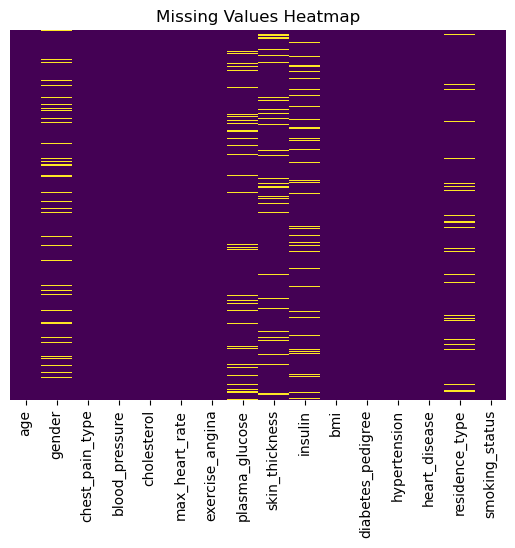

In [5]:
sns.heatmap(df.isnull(), cmap='viridis', cbar=False, yticklabels=False)
plt.title("Missing Values Heatmap")
plt.show()

In [6]:
df['age'].fillna(df['age'].median(), inplace=True)


In [7]:
#df = pd.get_dummies(df, columns=['age', 'blood_pressure'], drop_first=True)

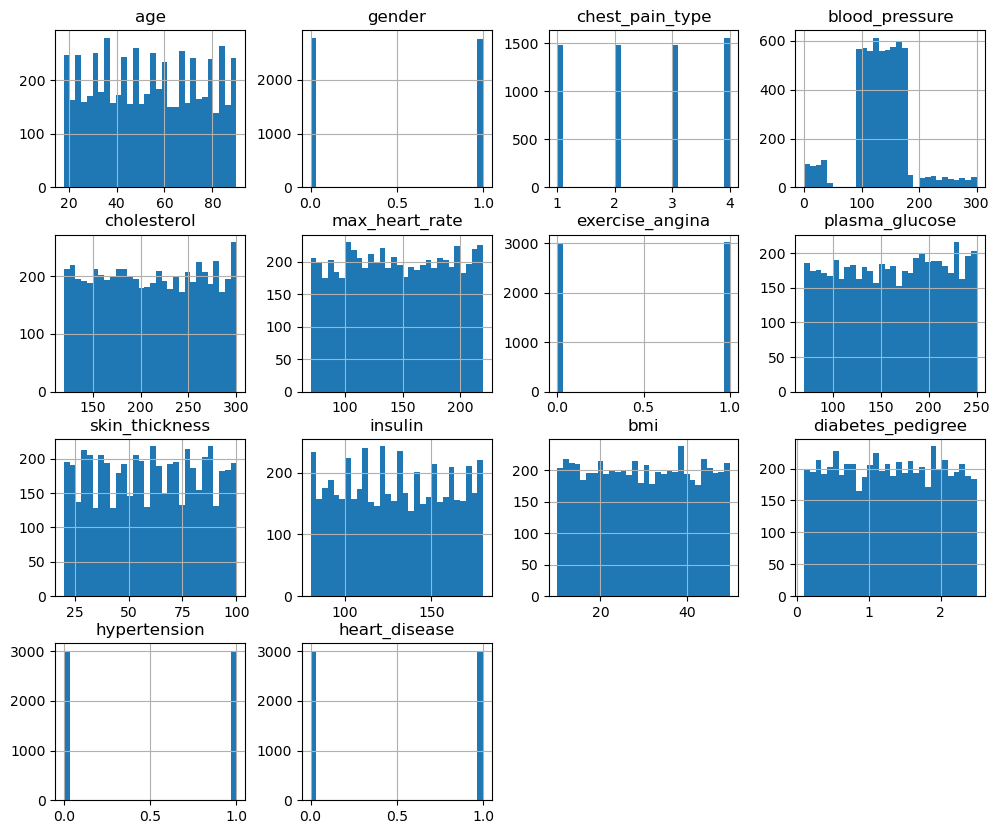

In [8]:
df.hist(figsize=(12, 10), bins=30)
plt.show()

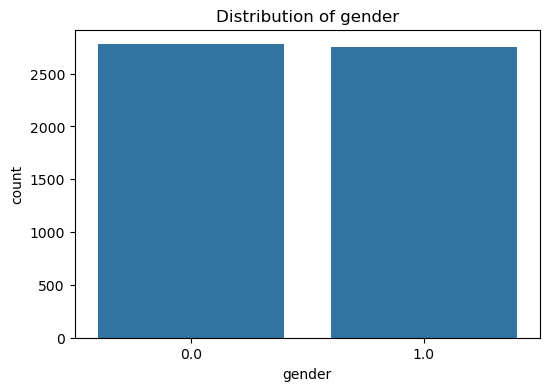

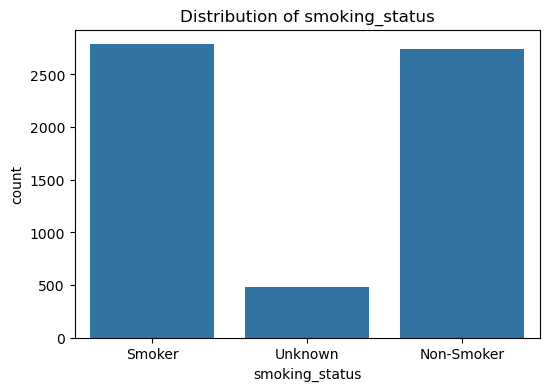

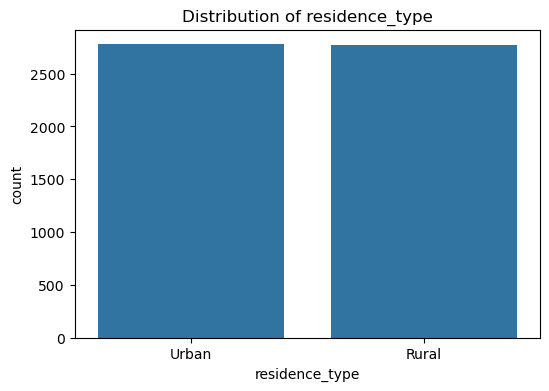

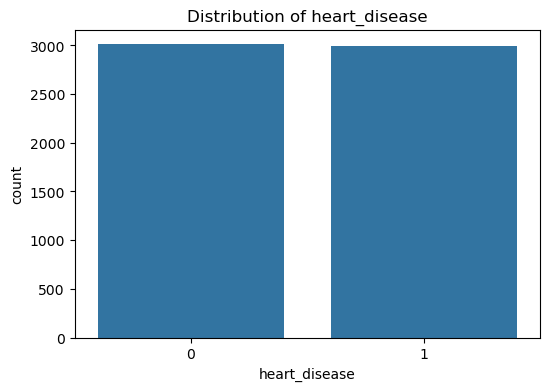

In [9]:
# Countplot for categorical variables
categorical_columns = ['gender', 'smoking_status', 'residence_type', 'heart_disease']
for col in categorical_columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=df[col])
    plt.title(f'Distribution of {col}')
    plt.show()

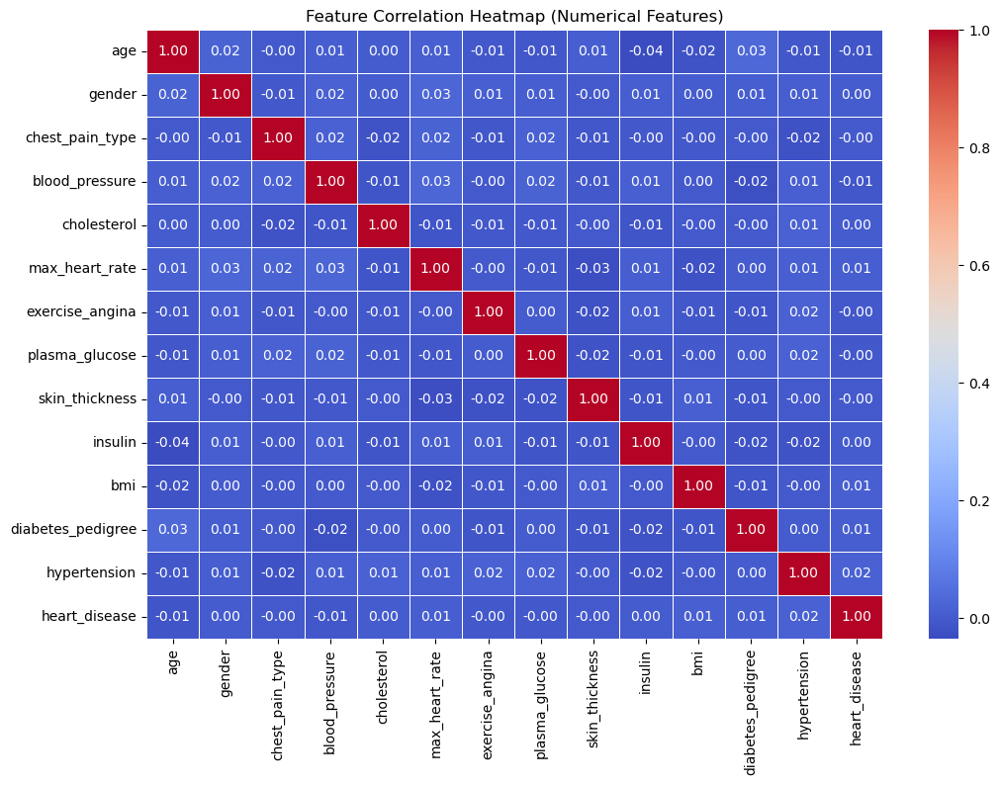

In [10]:
# Correlation heatmap for numerical features only
plt.figure(figsize=(12, 8))
numerical_df = df.select_dtypes(include=np.number)  # Select only numerical columns
sns.heatmap(numerical_df.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Feature Correlation Heatmap (Numerical Features)")
plt.show()

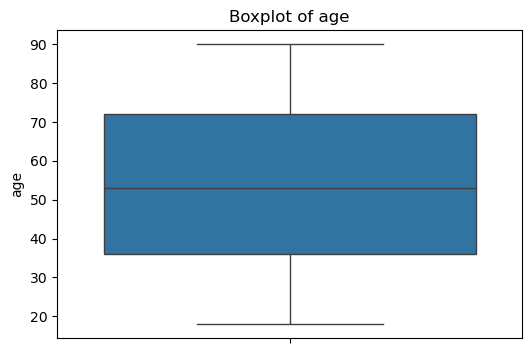

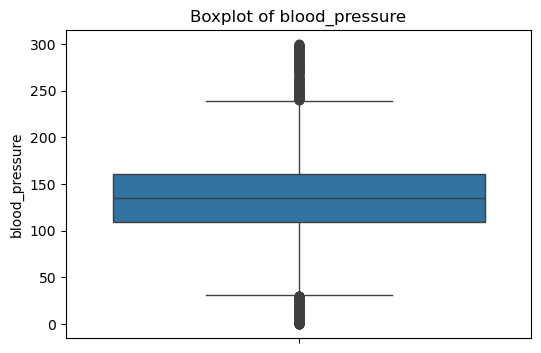

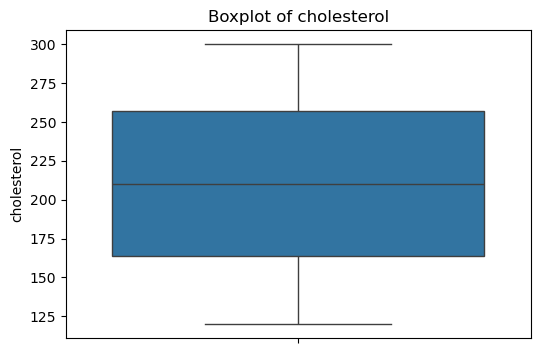

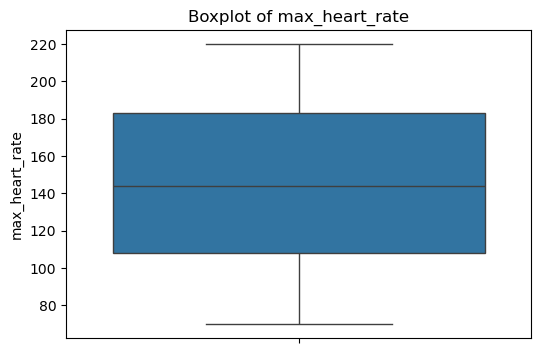

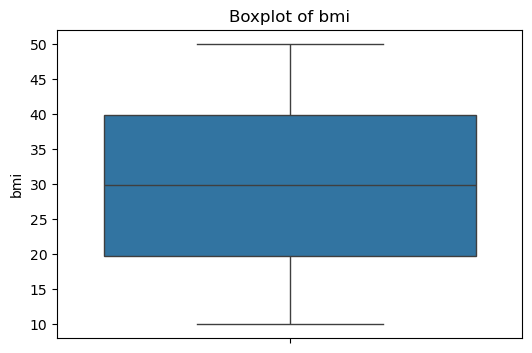

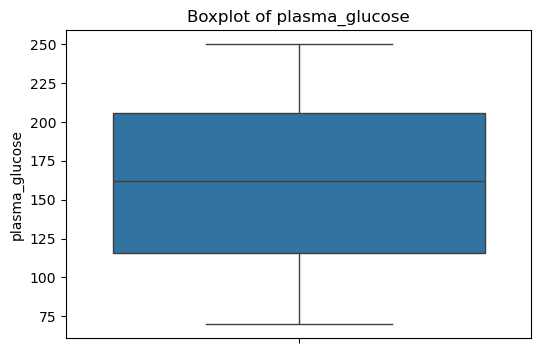

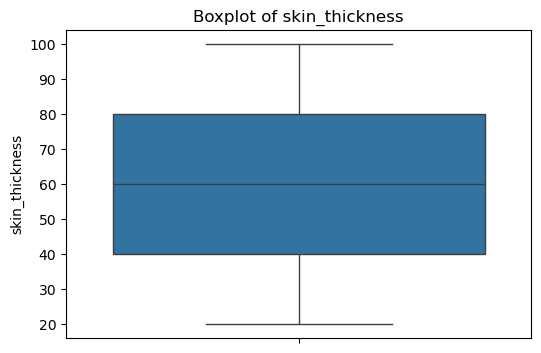

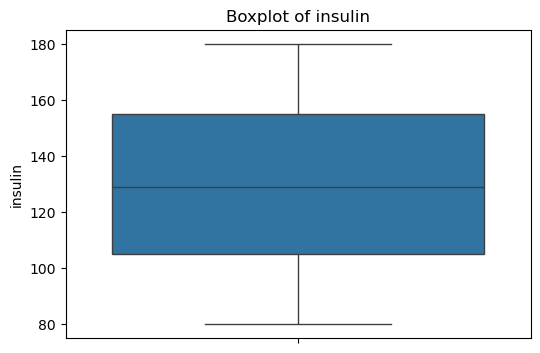

In [11]:
# Boxplots to check outliers
numerical_columns = ['age', 'blood_pressure', 'cholesterol', 'max_heart_rate', 'bmi', 'plasma_glucose', 'skin_thickness', 'insulin']
for col in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

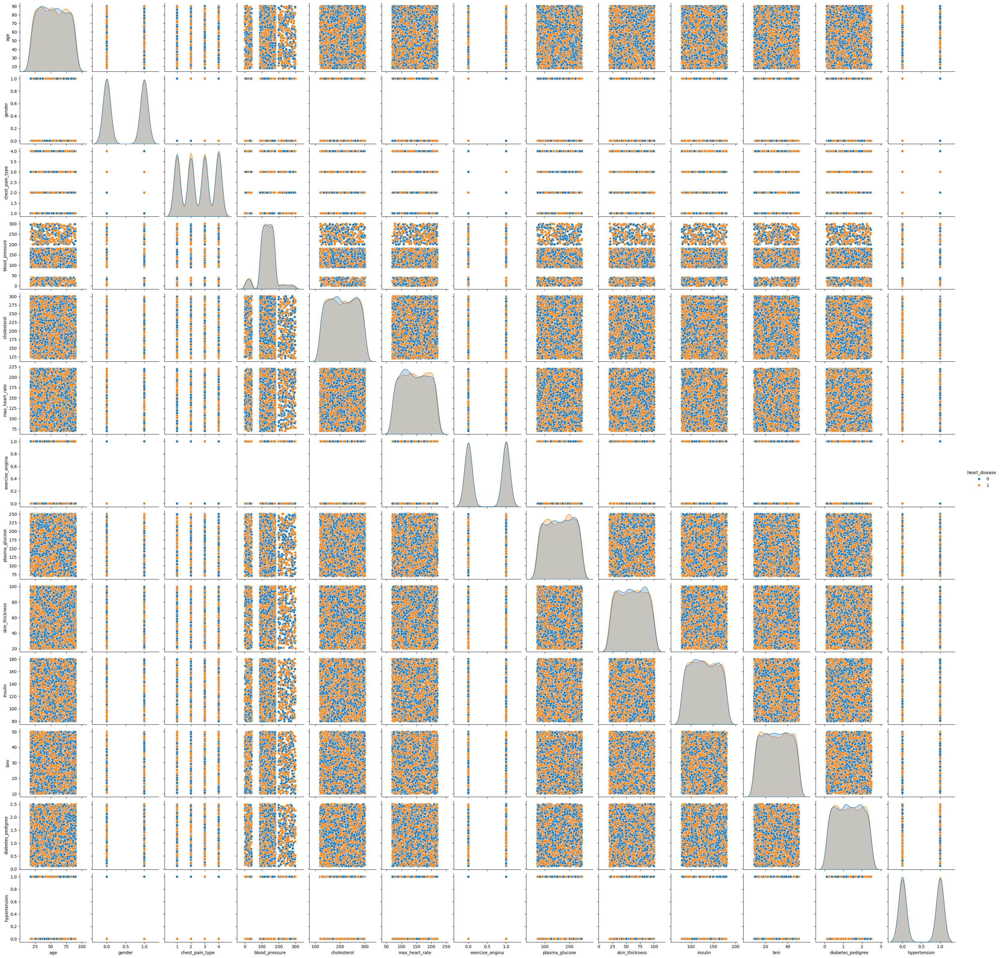

In [12]:
# Pairplot to visualize relationships between features
sns.pairplot(df, hue='heart_disease', diag_kind='kde')
plt.show()

#### Encode Categorical Features

In [13]:
# Fill numerical missing values with median
num_cols = ['age', 'blood_pressure', 'cholesterol', 'max_heart_rate',
            'plasma_glucose', 'skin_thickness', 'insulin', 'bmi']

df[num_cols] = df[num_cols].apply(lambda x: x.fillna(x.median()))

# Fill categorical missing values with mode
cat_cols = ['gender', 'chest_pain_type', 'exercise_angina', 'diabetes_pedigree',
            'hypertension', 'heart_disease', 'residence_type', 'smoking_status']

df[cat_cols] = df[cat_cols].apply(lambda x: x.fillna(x.mode()[0]))

In [14]:
label_enc = LabelEncoder()

for col in ['gender', 'chest_pain_type', 'exercise_angina', 'residence_type', 'smoking_status']:
    df[col] = label_enc.fit_transform(df[col])

# Convert Yes/No into 0/1
df['diabetes_pedigree'] = df['diabetes_pedigree'].replace({'Yes': 1, 'No': 0})
df['hypertension'] = df['hypertension'].replace({'Yes': 1, 'No': 0})
df['heart_disease'] = df['heart_disease'].replace({'Yes': 1, 'No': 0})


#### Perform Clustering (K-Means)

In [15]:
# Select features for clustering
clustering_features = df.drop(columns=['heart_disease'])

# Standardize Data
scaler = StandardScaler()
clustering_features_scaled = scaler.fit_transform(clustering_features)



#### Apply K-Means Clustering

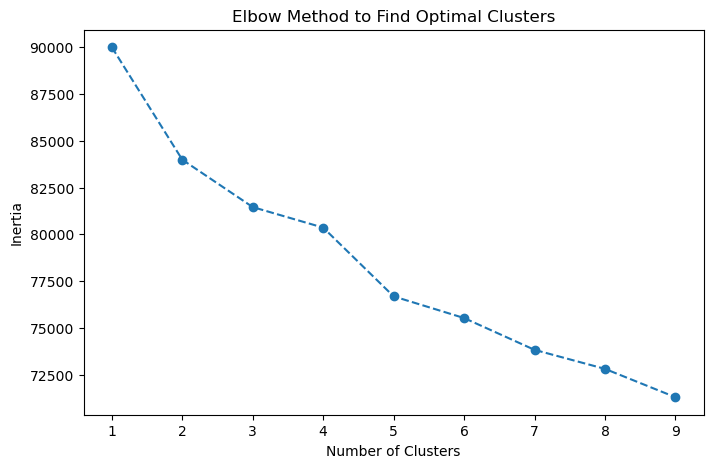

In [16]:
# Determine optimal number of clusters using Elbow Method
inertia = []
K_range = range(1, 10)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(clustering_features_scaled)
    inertia.append(kmeans.inertia_)

# Plot Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker='o', linestyle='--')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method to Find Optimal Clusters")
plt.show()


In [17]:
# Apply K-Means with chosen clusters (e.g., 3 clusters)
optimal_clusters = 3
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
df['cluster'] = kmeans.fit_predict(clustering_features_scaled)

# Display cluster distribution
print(df['cluster'].value_counts())


2    2767
0    1632
1    1601
Name: cluster, dtype: int64


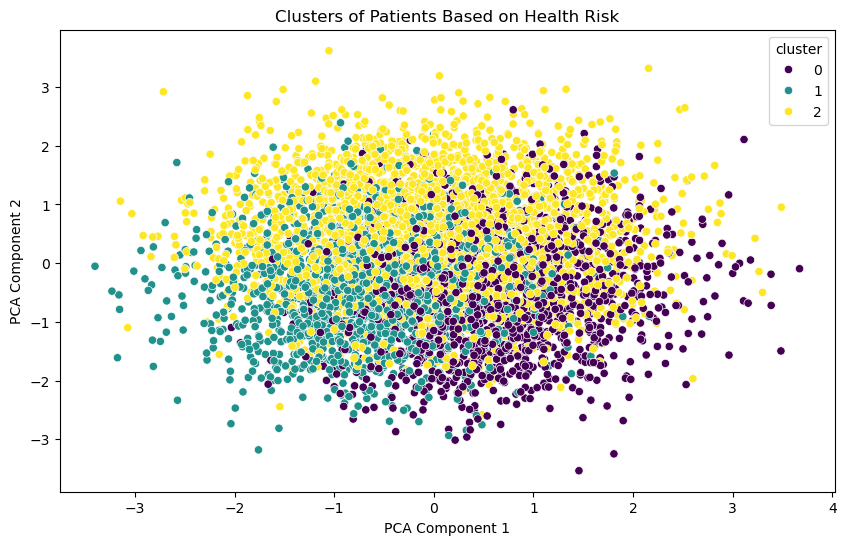

In [18]:
from sklearn.decomposition import PCA
# Reduce dimensions using PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(clustering_features_scaled)

# Convert PCA results to DataFrame
df['pca_1'] = pca_result[:, 0]
df['pca_2'] = pca_result[:, 1]

# Plot Clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['pca_1'], y=df['pca_2'], hue=df['cluster'], palette="viridis")
plt.title("Clusters of Patients Based on Health Risk")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


# Model building

In [19]:
# Define Features (including Clustering Information)
X = df[['chest_pain_type', 'exercise_angina', 'diabetes_pedigree','hypertension', 'heart_disease', 'residence_type', 'smoking_status','blood_pressure', 'cholesterol','max_heart_rate']]
y = df['cluster']

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Scale Features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


## Train Classification Models

### Logistic Regression

In [20]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression()
log_reg.fit(X_train_scaled, y_train)

# Predictions
y_pred_logreg = log_reg.predict(X_test_scaled)

# Evaluate Model
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_logreg))
print(classification_report(y_test, y_pred_logreg))


Logistic Regression Accuracy: 0.9658333333333333
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       326
           1       0.94      0.93      0.94       320
           2       1.00      1.00      1.00       554

    accuracy                           0.97      1200
   macro avg       0.96      0.96      0.96      1200
weighted avg       0.97      0.97      0.97      1200



### Random Forest

In [21]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predictions
y_pred_rf = rf.predict(X_test)

# Evaluate Model
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))


Random Forest Accuracy: 0.9641666666666666
              precision    recall  f1-score   support

           0       0.94      0.92      0.93       326
           1       0.92      0.94      0.93       320
           2       1.00      1.00      1.00       554

    accuracy                           0.96      1200
   macro avg       0.96      0.96      0.96      1200
weighted avg       0.96      0.96      0.96      1200



### XGBoost

In [22]:
!pip install xgboost

In [23]:
from xgboost import XGBClassifier

xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb.fit(X_train, y_train)

# Predictions
y_pred_xgb = xgb.predict(X_test)

# Evaluate Model
print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))
print(classification_report(y_test, y_pred_xgb))


XGBoost Accuracy: 0.9591666666666666
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       326
           1       0.92      0.92      0.92       320
           2       1.00      1.00      1.00       554

    accuracy                           0.96      1200
   macro avg       0.95      0.95      0.95      1200
weighted avg       0.96      0.96      0.96      1200



### Compare Model Performances

In [24]:
models = ["Logistic Regression", "Random Forest", "XGBoost"]
accuracies = [accuracy_score(y_test, y_pred_logreg),
              accuracy_score(y_test, y_pred_rf),
              accuracy_score(y_test, y_pred_xgb)]

for model, acc in zip(models, accuracies):
    print(f"{model}: {acc:.4f}")


Logistic Regression: 0.9658
Random Forest: 0.9642
XGBoost: 0.9592



Logistic Regression Accuracy: 0.9492
              precision    recall  f1-score   support

           0       0.89      0.92      0.91       326
           1       0.92      0.89      0.90       320
           2       1.00      1.00      1.00       554

    accuracy                           0.95      1200
   macro avg       0.94      0.94      0.94      1200
weighted avg       0.95      0.95      0.95      1200


Random Forest Accuracy: 0.9642
              precision    recall  f1-score   support

           0       0.94      0.92      0.93       326
           1       0.92      0.94      0.93       320
           2       1.00      1.00      1.00       554

    accuracy                           0.96      1200
   macro avg       0.96      0.96      0.96      1200
weighted avg       0.96      0.96      0.96      1200


XGBoost Accuracy: 0.9592
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       326
           1       0.92      0.92

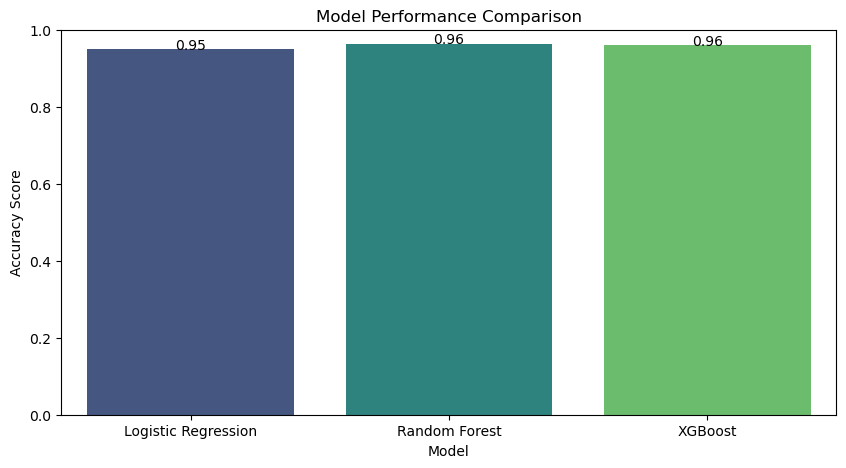

In [25]:
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
}

results = {}

# Train and Evaluate Each Model
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    results[name] = accuracy
    print(f"\n{name} Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, y_pred))

# Convert Results to DataFrame
results_df = pd.DataFrame(list(results.items()), columns=["Model", "Accuracy"])

# Plot Model Performance
plt.figure(figsize=(10, 5))
sns.barplot(x="Model", y="Accuracy", data=results_df, palette="viridis")
plt.title("Model Performance Comparison")
def addlabels(x,y):
    for i, value in enumerate(y):
        plt.text(i, value, f"{value:.2f}", ha='center',)
addlabels(results.keys(), list(results.values()))
plt.xlabel("Model")
plt.ylabel("Accuracy Score")
plt.ylim(0, 1)
plt.show()

In [28]:
import joblib

# Save the trained model
joblib.dump(log_reg, "logistic_regression.pkl")


['logistic_regression.pkl']

In [31]:
scaler = joblib.load("scaler.pkl")


In [32]:
joblib.dump(scaler, "scaler.pkl")


['scaler.pkl']